### Data Processing and Data Cleaning


In [183]:
import pandas as pd
import numpy as np
import plotly.express as px

billboard = pd.read_csv('/content/drive/Shareddrives/EMSE 6574 Python Project/billboard_hot100.csv')
spotify = pd.read_csv('/content/drive/Shareddrives/EMSE 6574 Python Project/SpotifyFeatures.csv')

In [184]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [185]:
billboard = billboard.set_index("Unnamed: 0")

In [186]:
billboard.info

<bound method DataFrame.info of                          Title                            Artist
Unnamed: 0                                                      
1              Blinding Lights                        The Weeknd
2                    The Twist                    Chubby Checker
3                       Smooth      Santana Featuring Rob Thomas
4               Mack The Knife                       Bobby Darin
5                 Uptown Funk!  Mark Ronson Featuring Bruno Mars
...                        ...                               ...
96                   Hot Stuff                      Donna Summer
97                    Rockstar   Post Malone Featuring 21 Savage
98          Gangsta's Paradise             Coolio Featuring L.V.
99                 Abracadabra             The Steve Miller Band
100             You're So Vain                       Carly Simon

[100 rows x 2 columns]>

In [187]:
spotify.head()

,genre,artist_name,track_name,track_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
0,Movie,Henri Salvador,C'est beau de faire un Show,0BRjO6ga9RKCKjfDqeFgWV,0,0.611,0.389,99373,0.910,0.000,C#,0.3460,-1.828,Major,0.0525,166.969,4/4,0.814
1,Movie,Martin & les fées,Perdu d'avance (par Gad Elmaleh),0BjC1NfoEOOusryehmNudP,1,0.246,0.590,137373,0.737,0.000,F#,0.1510,-5.559,Minor,0.0868,174.003,4/4,0.816
2,Movie,Joseph Williams,Don't Let Me Be Lonely Tonight,0CoSDzoNIKCRs124s9uTVy,3,0.952,0.663,170267,0.131,0.000,C,0.1030,-13.879,Minor,0.0362,99.488,5/4,0.368
3,Movie,Henri Salvador,Dis-moi Monsieur Gordon Cooper,0Gc6TVm52BwZD07Ki6tIvf,0,0.703,0.240,152427,0.326,0.000,C#,0.0985,-12.178,Major,0.0395,171.758,4/4,0.227
4,Movie,Fabien Nataf,Ouverture,0IuslXpMROHdEPvSl1fTQK,4,0.950,0.331,82625,0.225,0.123,F,0.2020,-21.150,Major,0.0456,140.576,4/4,0.390


In [188]:
len(spotify)

232725

In [61]:
# Matching the existing songs from the Top100 Billboard dataset to the Billboard dataset

spotify['Match'] = spotify['track_name'].isin(billboard['Title'])

In [62]:
spotify.drop_duplicates(subset = ['artist_name', 'track_name'], inplace = True)
match_test = spotify[spotify['Match'] == True]
match_test

,genre,artist_name,track_name,track_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,Match
1150,Alternative,Nickelback,Rockstar,6n9yCXvLhnYMgJIiIcMu7D,65,0.045900,0.616,252040,0.910,0.000000,C,0.3430,-3.004,Major,0.0386,144.073,4/4,0.693,True
1159,Alternative,Nickelback,How You Remind Me,0gmbgwZ8iqyMPmXefof8Yf,75,0.001350,0.446,223840,0.764,0.000000,A#,0.0990,-5.042,Major,0.0330,172.094,4/4,0.543,True
1326,Alternative,grandson,Apologize,1JG8pJ7G8qJiy98DzCBL2E,64,0.001210,0.535,198694,0.836,0.000000,D,0.1020,-5.593,Major,0.0746,85.005,4/4,0.443,True
1522,Alternative,Nine Inch Nails,Closer,2oDqmfa2g8W893LlwJG1qu,61,0.000311,0.585,373000,0.718,0.509000,A#,0.5830,-8.636,Minor,0.0416,90.009,4/4,0.573,True
1532,Alternative,Alex Clare,Too Close,4sK96UnGx3NjBaqvfTG2dm,56,0.013700,0.579,256560,0.731,0.000000,B,0.1130,-4.160,Minor,0.0452,126.070,4/4,0.284,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
230882,Soul,The Palms,Closer,43aQlpIFO6UxdBZ7pOXsSt,41,0.095600,0.798,224795,0.732,0.000921,G,0.3160,-6.862,Major,0.0344,165.036,4/4,0.908,True
230883,Soul,Colouring,I Heard It Through The Grapevine,4VX5UChOvUZunwat3obe6t,44,0.363000,0.314,229747,0.601,0.002500,B,0.1470,-7.766,Minor,0.0417,159.833,4/4,0.174,True
231584,Soul,Zapp,I Heard It Through The Grapevine,0eqWPB28jM1iQvOol7XLus,41,0.348000,0.880,408800,0.528,0.000085,D,0.2670,-11.505,Major,0.0692,118.457,4/4,0.931,True
232014,Soul,Slow Magic,Closer,6EVATaxTsB2RexbqTqtlIO,40,0.302000,0.541,366606,0.571,0.000271,A#,0.3050,-7.256,Minor,0.1140,150.949,4/4,0.344,True


In [63]:
len(match_test['track_name'].unique())

72

In [64]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import statsmodels.api as sm
import seaborn as sns
import random

In [65]:
# Cleaning Spotify data
# Convert miliseconds duration into seconds
spotify['duration_s'] = spotify['duration_ms']/60
spotify['duration_s'].head()

0    1656.216667
1    2289.550000
2    2837.783333
3    2540.450000
4    1377.083333
Name: duration_s, dtype: float64

In [66]:
spotify = spotify.drop(columns = ['track_id','duration_ms', 'key', 'mode', 'time_signature', 'Match']).dropna()
spotify

,genre,artist_name,track_name,popularity,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,duration_s
0,Movie,Henri Salvador,C'est beau de faire un Show,0,0.6110,0.389,0.910,0.000000,0.3460,-1.828,0.0525,166.969,0.814,1656.216667
1,Movie,Martin & les fées,Perdu d'avance (par Gad Elmaleh),1,0.2460,0.590,0.737,0.000000,0.1510,-5.559,0.0868,174.003,0.816,2289.550000
2,Movie,Joseph Williams,Don't Let Me Be Lonely Tonight,3,0.9520,0.663,0.131,0.000000,0.1030,-13.879,0.0362,99.488,0.368,2837.783333
3,Movie,Henri Salvador,Dis-moi Monsieur Gordon Cooper,0,0.7030,0.240,0.326,0.000000,0.0985,-12.178,0.0395,171.758,0.227,2540.450000
4,Movie,Fabien Nataf,Ouverture,4,0.9500,0.331,0.225,0.123000,0.2020,-21.150,0.0456,140.576,0.390,1377.083333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
232714,Soul,H-Town,They Like It Slow,39,0.1130,0.611,0.493,0.000000,0.1050,-9.297,0.0354,115.920,0.443,4658.500000
232716,Soul,John Legend,Quickly (feat. Brandy),39,0.2310,0.736,0.701,0.000000,0.2030,-4.345,0.1000,99.991,0.770,3711.116667
232717,Soul,Belly,P.O.P.,43,0.1040,0.802,0.516,0.000485,0.1050,-9.014,0.2130,175.666,0.482,3352.883333
232721,Soul,Jr Thomas & The Volcanos,Burning Fire,38,0.0329,0.785,0.683,0.000880,0.2370,-6.944,0.0337,113.830,0.969,4707.450000


In [67]:
# Clean up artist names

spotify['artist_name']= spotify['artist_name'].str.replace('[', '')
spotify['artist_name']= spotify['artist_name'].str.replace(']', '')
spotify.head()

<ipython-input-67-e77755f75df9>:3: FutureWarning:

The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.

<ipython-input-67-e77755f75df9>:4: FutureWarning:

The default value of regex will change from True to False in a future version. In addition, single character regular expressions will *not* be treated as literal strings when regex=True.



,genre,artist_name,track_name,popularity,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,duration_s
0,Movie,Henri Salvador,C'est beau de faire un Show,0,0.611,0.389,0.910,0.000,0.3460,-1.828,0.0525,166.969,0.814,1656.216667
1,Movie,Martin & les fées,Perdu d'avance (par Gad Elmaleh),1,0.246,0.590,0.737,0.000,0.1510,-5.559,0.0868,174.003,0.816,2289.550000
2,Movie,Joseph Williams,Don't Let Me Be Lonely Tonight,3,0.952,0.663,0.131,0.000,0.1030,-13.879,0.0362,99.488,0.368,2837.783333
3,Movie,Henri Salvador,Dis-moi Monsieur Gordon Cooper,0,0.703,0.240,0.326,0.000,0.0985,-12.178,0.0395,171.758,0.227,2540.450000
4,Movie,Fabien Nataf,Ouverture,4,0.950,0.331,0.225,0.123,0.2020,-21.150,0.0456,140.576,0.390,1377.083333


In [68]:
spotify.describe()

,popularity,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,duration_s
count,176514.000000,176514.000000,176514.000000,176514.000000,176514.000000,176514.000000,176514.000000,176514.000000,176514.000000,176514.000000,176514.000000
mean,36.257634,0.403876,0.541111,0.557203,0.172211,0.224628,-10.137290,0.127471,117.214397,0.451642,3935.900094
std,17.392089,0.366286,0.190441,0.275855,0.323038,0.211150,6.398382,0.204460,31.323689,0.267853,2176.247788
min,0.000000,0.000000,0.056900,0.000020,0.000000,0.009670,-52.457000,0.022200,30.379000,0.000000,256.450000
25%,25.000000,0.045500,0.415000,0.344000,0.000000,0.097500,-12.850000,0.036800,92.007000,0.222000,2971.333333
50%,37.000000,0.288000,0.558000,0.592000,0.000071,0.130000,-8.189000,0.049400,115.009000,0.440000,3657.916667
75%,49.000000,0.791000,0.683000,0.789000,0.091400,0.277000,-5.629000,0.102000,138.825000,0.667000,4476.216667
max,100.000000,0.996000,0.989000,0.999000,0.999000,1.000000,3.744000,0.967000,242.903000,1.000000,92548.616667


In [69]:
spotify.columns

Index(['genre', 'artist_name', 'track_name', 'popularity', 'acousticness',
       'danceability', 'energy', 'instrumentalness', 'liveness', 'loudness',
       'speechiness', 'tempo', 'valence', 'duration_s'],
      dtype='object')

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



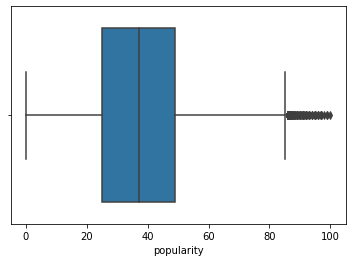

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



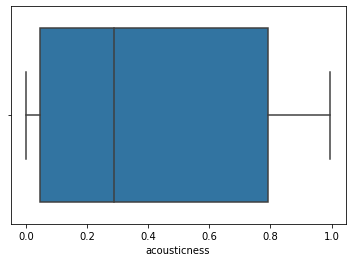

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



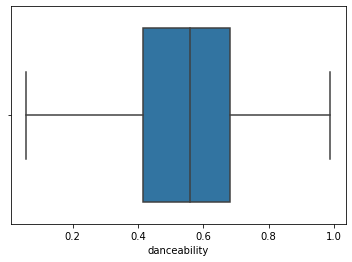

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



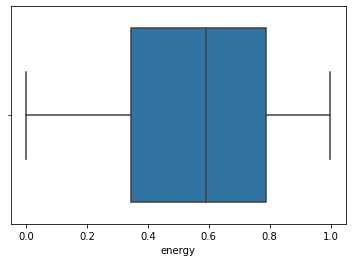

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



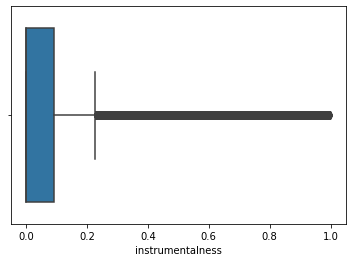

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



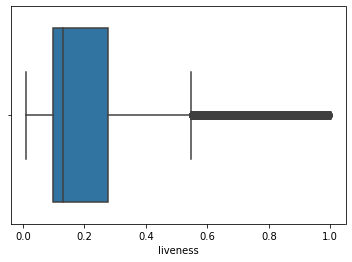

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



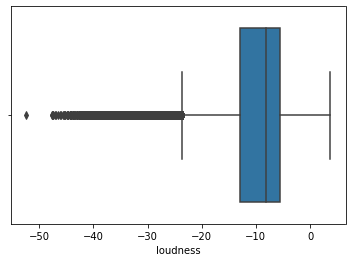

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



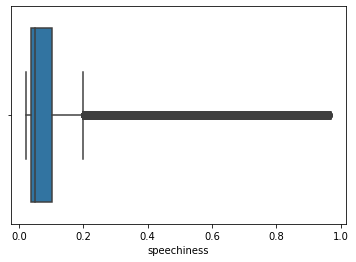

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



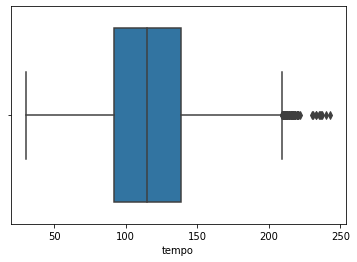

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



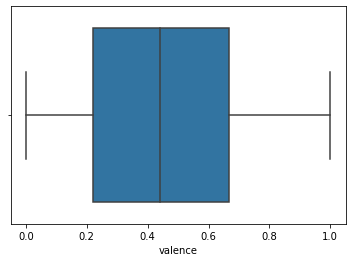

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



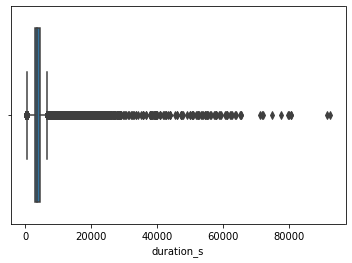

In [70]:
# Looking at audio features distribution

cols = ['popularity', 'acousticness',
       'danceability', 'energy', 'instrumentalness', 'liveness', 'loudness',
       'speechiness', 'tempo', 'valence', 'duration_s']
for c in cols:
    sns.boxplot(spotify[c],whis=1.5)
    plt.show();

### Exploratory Data Analysis (EDA)

In [71]:
spotify

,genre,artist_name,track_name,popularity,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,duration_s
0,Movie,Henri Salvador,C'est beau de faire un Show,0,0.6110,0.389,0.910,0.000000,0.3460,-1.828,0.0525,166.969,0.814,1656.216667
1,Movie,Martin & les fées,Perdu d'avance (par Gad Elmaleh),1,0.2460,0.590,0.737,0.000000,0.1510,-5.559,0.0868,174.003,0.816,2289.550000
2,Movie,Joseph Williams,Don't Let Me Be Lonely Tonight,3,0.9520,0.663,0.131,0.000000,0.1030,-13.879,0.0362,99.488,0.368,2837.783333
3,Movie,Henri Salvador,Dis-moi Monsieur Gordon Cooper,0,0.7030,0.240,0.326,0.000000,0.0985,-12.178,0.0395,171.758,0.227,2540.450000
4,Movie,Fabien Nataf,Ouverture,4,0.9500,0.331,0.225,0.123000,0.2020,-21.150,0.0456,140.576,0.390,1377.083333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
232714,Soul,H-Town,They Like It Slow,39,0.1130,0.611,0.493,0.000000,0.1050,-9.297,0.0354,115.920,0.443,4658.500000
232716,Soul,John Legend,Quickly (feat. Brandy),39,0.2310,0.736,0.701,0.000000,0.2030,-4.345,0.1000,99.991,0.770,3711.116667
232717,Soul,Belly,P.O.P.,43,0.1040,0.802,0.516,0.000485,0.1050,-9.014,0.2130,175.666,0.482,3352.883333
232721,Soul,Jr Thomas & The Volcanos,Burning Fire,38,0.0329,0.785,0.683,0.000880,0.2370,-6.944,0.0337,113.830,0.969,4707.450000


In [72]:
spotify.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 176514 entries, 0 to 232724
Data columns (total 14 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   genre             176514 non-null  object 
 1   artist_name       176514 non-null  object 
 2   track_name        176514 non-null  object 
 3   popularity        176514 non-null  int64  
 4   acousticness      176514 non-null  float64
 5   danceability      176514 non-null  float64
 6   energy            176514 non-null  float64
 7   instrumentalness  176514 non-null  float64
 8   liveness          176514 non-null  float64
 9   loudness          176514 non-null  float64
 10  speechiness       176514 non-null  float64
 11  tempo             176514 non-null  float64
 12  valence           176514 non-null  float64
 13  duration_s        176514 non-null  float64
dtypes: float64(10), int64(1), object(3)
memory usage: 20.2+ MB


In [73]:
px.scatter(spotify, x = 'acousticness', y = 'popularity', color = 'popularity')

In [74]:
px.scatter(spotify, x = 'danceability', y = 'popularity', color = 'popularity')

In [75]:
px.scatter(spotify, x = 'energy', y = 'popularity', color = 'popularity')

In [76]:
px.scatter(spotify, x = 'instrumentalness', y = 'popularity', color = 'popularity')

In [77]:
px.scatter(spotify, x = 'liveness', y = 'popularity', color = 'popularity')

In [78]:
px.scatter(spotify, x = 'loudness', y = 'popularity', color = 'popularity')

In [79]:
px.scatter(spotify, x = 'speechiness', y = 'popularity', color = 'popularity')

In [80]:
px.scatter(spotify, x = 'tempo', y = 'popularity', color = 'popularity')

In [81]:
#px.scatter(spotify, x = 'duration_ms', y = 'popularity', color = 'popularity')

In [82]:
popular_songs = spotify[['artist_name', 'track_name', 'popularity']]
ps_sorted = popular_songs.sort_values(by = 'popularity', ascending = False)
ps_sorted = ps_sorted.head(100)
ps_sorted.drop_duplicates(subset = ('artist_name', 'track_name'), inplace = True)

In [83]:
px.histogram(ps_sorted, 'popularity', color = 'artist_name')

In [84]:
px.histogram(ps_sorted, 'artist_name', color = 'popularity')

In [85]:
spotify.corr()

,popularity,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,duration_s
popularity,1.000000,-0.360135,0.222389,0.234832,-0.147710,-0.161468,0.321909,-0.162004,0.083273,0.049098,0.019495
acousticness,-0.360135,1.000000,-0.379294,-0.729846,0.305704,0.079255,-0.693343,0.173081,-0.261013,-0.348968,0.010344
danceability,0.222389,-0.379294,1.000000,0.365248,-0.371128,-0.026929,0.460690,0.133068,0.046894,0.587775,-0.124303
energy,0.234832,-0.729846,0.365248,1.000000,-0.392375,0.210203,0.824673,0.162323,0.241545,0.449535,-0.029942
instrumentalness,-0.147710,0.305704,-0.371128,-0.392375,1.000000,-0.162877,-0.501543,-0.191822,-0.109592,-0.331535,0.069401
liveness,-0.161468,0.079255,-0.026929,0.210203,-0.162877,1.000000,0.057729,0.555551,-0.062172,0.005688,0.023721
loudness,0.321909,-0.693343,0.460690,0.824673,-0.501543,0.057729,1.000000,0.000755,0.246446,0.427036,-0.042834
speechiness,-0.162004,0.173081,0.133068,0.162323,-0.191822,0.555551,0.000755,1.000000,-0.101701,0.018707,-0.011592
tempo,0.083273,-0.261013,0.046894,0.241545,-0.109592,-0.062172,0.246446,-0.101701,1.000000,0.159027,-0.030067
valence,0.049098,-0.348968,0.587775,0.449535,-0.331535,0.005688,0.427036,0.018707,0.159027,1.000000,-0.146919


In [86]:
cols = ['acousticness',
       'danceability', 'energy', 'instrumentalness', 'liveness', 'loudness',
       'speechiness', 'tempo', 'valence']

corr_dict = {'category': [],'popularity_correlation':[]}

for c in cols:
    column = spotify[c]
    correlation = spotify['popularity'].corr(column)
    corr_dict['category'].append(c)
    corr_dict['popularity_correlation'].append(correlation)

new_dict = pd.DataFrame(corr_dict)

In [179]:
new_dict

,category,popularity_correlation
0,acousticness,-0.360135
1,danceability,0.222389
2,energy,0.234832
3,instrumentalness,-0.147710
4,liveness,-0.161468
5,loudness,0.321909
6,speechiness,-0.162004
7,tempo,0.083273
8,valence,0.049098


In [87]:
billboard.reset_index(inplace = True)

In [88]:
billboard

,Unnamed: 0,Title,Artist
0,1,Blinding Lights,The Weeknd
1,2,The Twist,Chubby Checker
2,3,Smooth,Santana Featuring Rob Thomas
3,4,Mack The Knife,Bobby Darin
4,5,Uptown Funk!,Mark Ronson Featuring Bruno Mars
...,...,...,...
95,96,Hot Stuff,Donna Summer
96,97,Rockstar,Post Malone Featuring 21 Savage
97,98,Gangsta's Paradise,Coolio Featuring L.V.
98,99,Abracadabra,The Steve Miller Band


In [89]:
billboard.rename(columns = {'Title': 'track_name', 'Artist': 'artist_name'}, inplace = True)

In [91]:
spotify_test = spotify.drop_duplicates(subset = ['artist_name', 'track_name'])

In [92]:
merge1 = billboard.merge(spotify, on = 'track_name')

In [93]:
#check to see if billboard songs are in spotify songs 

#for song in billboard, 

'''
for duo in zip(billboard['artist_name'], billboard['track_name']):
  if spotify[['artist_name', 'track_name']] == duo:
    spotify['exists'] == 1
  else:
    spotify['exists'] == 0
'''

#for track in billboard['track_name']:
#  print(track)

df3 = spotify.merge(billboard, left_on = ['track_name', 'artist_name'], right_on= ['track_name', 'artist_name'],  how='left', indicator=True)
#df3.reset_index(inplace = True)
#df3 = df3[df3['_merge'] == 'both']

In [106]:
df3

,genre,artist_name,track_name,popularity,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,duration_s,Unnamed: 0,_merge
0,Movie,Henri Salvador,C'est beau de faire un Show,0,0.6110,0.389,0.910,0.000000,0.3460,-1.828,0.0525,166.969,0.814,1656.216667,NaN,left_only
1,Movie,Martin & les fées,Perdu d'avance (par Gad Elmaleh),1,0.2460,0.590,0.737,0.000000,0.1510,-5.559,0.0868,174.003,0.816,2289.550000,NaN,left_only
2,Movie,Joseph Williams,Don't Let Me Be Lonely Tonight,3,0.9520,0.663,0.131,0.000000,0.1030,-13.879,0.0362,99.488,0.368,2837.783333,NaN,left_only
3,Movie,Henri Salvador,Dis-moi Monsieur Gordon Cooper,0,0.7030,0.240,0.326,0.000000,0.0985,-12.178,0.0395,171.758,0.227,2540.450000,NaN,left_only
4,Movie,Fabien Nataf,Ouverture,4,0.9500,0.331,0.225,0.123000,0.2020,-21.150,0.0456,140.576,0.390,1377.083333,NaN,left_only
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
176509,Soul,H-Town,They Like It Slow,39,0.1130,0.611,0.493,0.000000,0.1050,-9.297,0.0354,115.920,0.443,4658.500000,NaN,left_only
176510,Soul,John Legend,Quickly (feat. Brandy),39,0.2310,0.736,0.701,0.000000,0.2030,-4.345,0.1000,99.991,0.770,3711.116667,NaN,left_only
176511,Soul,Belly,P.O.P.,43,0.1040,0.802,0.516,0.000485,0.1050,-9.014,0.2130,175.666,0.482,3352.883333,NaN,left_only
176512,Soul,Jr Thomas & The Volcanos,Burning Fire,38,0.0329,0.785,0.683,0.000880,0.2370,-6.944,0.0337,113.830,0.969,4707.450000,NaN,left_only


In [109]:
#df3['_merge'].unique()
test2 = df3[(df3['_merge'] == 'both')]

In [108]:
df3._merge.unique()

['left_only', 'both']
Categories (3, object): ['left_only', 'right_only', 'both']

In [114]:
test2._merge.count()

40

In [123]:
new_df = df3.rename(columns = {'_merge': 'match'})

In [124]:
new_df

,genre,artist_name,track_name,popularity,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,duration_s,Unnamed: 0,match
0,Movie,Henri Salvador,C'est beau de faire un Show,0,0.6110,0.389,0.910,0.000000,0.3460,-1.828,0.0525,166.969,0.814,1656.216667,NaN,left_only
1,Movie,Martin & les fées,Perdu d'avance (par Gad Elmaleh),1,0.2460,0.590,0.737,0.000000,0.1510,-5.559,0.0868,174.003,0.816,2289.550000,NaN,left_only
2,Movie,Joseph Williams,Don't Let Me Be Lonely Tonight,3,0.9520,0.663,0.131,0.000000,0.1030,-13.879,0.0362,99.488,0.368,2837.783333,NaN,left_only
3,Movie,Henri Salvador,Dis-moi Monsieur Gordon Cooper,0,0.7030,0.240,0.326,0.000000,0.0985,-12.178,0.0395,171.758,0.227,2540.450000,NaN,left_only
4,Movie,Fabien Nataf,Ouverture,4,0.9500,0.331,0.225,0.123000,0.2020,-21.150,0.0456,140.576,0.390,1377.083333,NaN,left_only
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
176509,Soul,H-Town,They Like It Slow,39,0.1130,0.611,0.493,0.000000,0.1050,-9.297,0.0354,115.920,0.443,4658.500000,NaN,left_only
176510,Soul,John Legend,Quickly (feat. Brandy),39,0.2310,0.736,0.701,0.000000,0.2030,-4.345,0.1000,99.991,0.770,3711.116667,NaN,left_only
176511,Soul,Belly,P.O.P.,43,0.1040,0.802,0.516,0.000485,0.1050,-9.014,0.2130,175.666,0.482,3352.883333,NaN,left_only
176512,Soul,Jr Thomas & The Volcanos,Burning Fire,38,0.0329,0.785,0.683,0.000880,0.2370,-6.944,0.0337,113.830,0.969,4707.450000,NaN,left_only


In [150]:
new_df

,genre,artist_name,track_name,popularity,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,duration_s,Unnamed: 0,match
0,Movie,Henri Salvador,C'est beau de faire un Show,0,0.6110,0.389,0.910,0.000000,0.3460,-1.828,0.0525,166.969,0.814,1656.216667,NaN,left_only
1,Movie,Martin & les fées,Perdu d'avance (par Gad Elmaleh),1,0.2460,0.590,0.737,0.000000,0.1510,-5.559,0.0868,174.003,0.816,2289.550000,NaN,left_only
2,Movie,Joseph Williams,Don't Let Me Be Lonely Tonight,3,0.9520,0.663,0.131,0.000000,0.1030,-13.879,0.0362,99.488,0.368,2837.783333,NaN,left_only
3,Movie,Henri Salvador,Dis-moi Monsieur Gordon Cooper,0,0.7030,0.240,0.326,0.000000,0.0985,-12.178,0.0395,171.758,0.227,2540.450000,NaN,left_only
4,Movie,Fabien Nataf,Ouverture,4,0.9500,0.331,0.225,0.123000,0.2020,-21.150,0.0456,140.576,0.390,1377.083333,NaN,left_only
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
176509,Soul,H-Town,They Like It Slow,39,0.1130,0.611,0.493,0.000000,0.1050,-9.297,0.0354,115.920,0.443,4658.500000,NaN,left_only
176510,Soul,John Legend,Quickly (feat. Brandy),39,0.2310,0.736,0.701,0.000000,0.2030,-4.345,0.1000,99.991,0.770,3711.116667,NaN,left_only
176511,Soul,Belly,P.O.P.,43,0.1040,0.802,0.516,0.000485,0.1050,-9.014,0.2130,175.666,0.482,3352.883333,NaN,left_only
176512,Soul,Jr Thomas & The Volcanos,Burning Fire,38,0.0329,0.785,0.683,0.000880,0.2370,-6.944,0.0337,113.830,0.969,4707.450000,NaN,left_only


In [170]:
final = pd.DataFrame()

matched = new_df[(new_df['match'] == 'both')]
matched['match'] = 1
unmatched = new_df[(new_df['match'] == 'left_only')]
unmatched['match'] = 0

final = final.append(matched)

<ipython-input-170-1b0a6650e2e6>:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-170-1b0a6650e2e6>:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [173]:
final = final.append(unmatched)

In [176]:
final

,genre,artist_name,track_name,popularity,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,duration_s,Unnamed: 0,match
1159,Alternative,Nickelback,How You Remind Me,75,0.00135,0.446,0.764,0.000000,0.0990,-5.042,0.0330,172.094,0.543,3730.666667,51.0,1
7012,Country,Andy Gibb,Shadow Dancing,46,0.14200,0.742,0.600,0.000000,0.0677,-9.647,0.0319,101.920,0.954,4600.000000,55.0,1
13501,Dance,Mariah Carey,We Belong Together,72,0.03580,0.838,0.469,0.000000,0.0928,-7.992,0.0835,139.975,0.778,3356.666667,15.0,1
13522,Dance,Mario,Let Me Love You,80,0.23500,0.656,0.578,0.000000,0.1180,-8.970,0.0922,94.514,0.556,4278.883333,65.0,1
13570,Dance,The Black Eyed Peas,I Gotta Feeling,70,0.08230,0.741,0.748,0.000000,0.3400,-6.299,0.0264,127.965,0.600,4818.883333,8.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
176509,Soul,H-Town,They Like It Slow,39,0.11300,0.611,0.493,0.000000,0.1050,-9.297,0.0354,115.920,0.443,4658.500000,NaN,0
176510,Soul,John Legend,Quickly (feat. Brandy),39,0.23100,0.736,0.701,0.000000,0.2030,-4.345,0.1000,99.991,0.770,3711.116667,NaN,0
176511,Soul,Belly,P.O.P.,43,0.10400,0.802,0.516,0.000485,0.1050,-9.014,0.2130,175.666,0.482,3352.883333,NaN,0
176512,Soul,Jr Thomas & The Volcanos,Burning Fire,38,0.03290,0.785,0.683,0.000880,0.2370,-6.944,0.0337,113.830,0.969,4707.450000,NaN,0


In [178]:
final.to_csv('/content/drive/MyDrive/EMSE_6574_HW/final_pres/final.csv')


In [182]:
matched.sort_values(by ='popularity', ascending= False)

,genre,artist_name,track_name,popularity,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,duration_s,Unnamed: 0,match
61277,Hip-Hop,Drake,God's Plan,89,0.033200,0.754,0.449,0.000083,0.5520,-9.211,0.1090,77.169,0.357,3316.216667,83.0,1
88740,Pop,Ed Sheeran,Perfect,89,0.163000,0.599,0.448,0.000000,0.1060,-6.312,0.0232,95.050,0.168,4390.000000,62.0,1
88781,Pop,Michael Jackson,Billie Jean,83,0.023600,0.920,0.654,0.015800,0.0359,-3.051,0.0401,117.046,0.847,4897.116667,95.0,1
13522,Dance,Mario,Let Me Love You,80,0.235000,0.656,0.578,0.000000,0.1180,-8.970,0.0922,94.514,0.556,4278.883333,65.0,1
88848,Pop,Alicia Keys,No One,80,0.020900,0.644,0.548,0.000009,0.1340,-5.416,0.0286,90.042,0.166,4230.216667,59.0,1
13665,Dance,Lorde,Royals,77,0.106000,0.616,0.432,0.000000,0.1320,-9.546,0.1330,84.778,0.302,3169.750000,77.0,1
1159,Alternative,Nickelback,How You Remind Me,75,0.001350,0.446,0.764,0.000000,0.0990,-5.042,0.0330,172.094,0.543,3730.666667,51.0,1
13791,Dance,Pharrell Williams,Happy,75,0.286000,0.652,0.757,0.000000,0.0886,-6.819,0.1530,159.911,0.962,3888.416667,88.0,1
14408,Dance,Shania Twain,You're Still The One,75,0.450000,0.551,0.527,0.000000,0.0867,-7.119,0.0302,133.758,0.642,3542.666667,94.0,1
89883,Pop,Kim Carnes,Bette Davis Eyes,73,0.020400,0.675,0.649,0.000000,0.0959,-10.271,0.0319,116.624,0.596,3800.000000,18.0,1


In [189]:
final

,genre,artist_name,track_name,popularity,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,duration_s,Unnamed: 0,match
1159,Alternative,Nickelback,How You Remind Me,75,0.00135,0.446,0.764,0.000000,0.0990,-5.042,0.0330,172.094,0.543,3730.666667,51.0,1
7012,Country,Andy Gibb,Shadow Dancing,46,0.14200,0.742,0.600,0.000000,0.0677,-9.647,0.0319,101.920,0.954,4600.000000,55.0,1
13501,Dance,Mariah Carey,We Belong Together,72,0.03580,0.838,0.469,0.000000,0.0928,-7.992,0.0835,139.975,0.778,3356.666667,15.0,1
13522,Dance,Mario,Let Me Love You,80,0.23500,0.656,0.578,0.000000,0.1180,-8.970,0.0922,94.514,0.556,4278.883333,65.0,1
13570,Dance,The Black Eyed Peas,I Gotta Feeling,70,0.08230,0.741,0.748,0.000000,0.3400,-6.299,0.0264,127.965,0.600,4818.883333,8.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
176509,Soul,H-Town,They Like It Slow,39,0.11300,0.611,0.493,0.000000,0.1050,-9.297,0.0354,115.920,0.443,4658.500000,NaN,0
176510,Soul,John Legend,Quickly (feat. Brandy),39,0.23100,0.736,0.701,0.000000,0.2030,-4.345,0.1000,99.991,0.770,3711.116667,NaN,0
176511,Soul,Belly,P.O.P.,43,0.10400,0.802,0.516,0.000485,0.1050,-9.014,0.2130,175.666,0.482,3352.883333,NaN,0
176512,Soul,Jr Thomas & The Volcanos,Burning Fire,38,0.03290,0.785,0.683,0.000880,0.2370,-6.944,0.0337,113.830,0.969,4707.450000,NaN,0


In [190]:
final = final.drop(columns = ['match'])

In [191]:
final

,genre,artist_name,track_name,popularity,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,duration_s,Unnamed: 0
1159,Alternative,Nickelback,How You Remind Me,75,0.00135,0.446,0.764,0.000000,0.0990,-5.042,0.0330,172.094,0.543,3730.666667,51.0
7012,Country,Andy Gibb,Shadow Dancing,46,0.14200,0.742,0.600,0.000000,0.0677,-9.647,0.0319,101.920,0.954,4600.000000,55.0
13501,Dance,Mariah Carey,We Belong Together,72,0.03580,0.838,0.469,0.000000,0.0928,-7.992,0.0835,139.975,0.778,3356.666667,15.0
13522,Dance,Mario,Let Me Love You,80,0.23500,0.656,0.578,0.000000,0.1180,-8.970,0.0922,94.514,0.556,4278.883333,65.0
13570,Dance,The Black Eyed Peas,I Gotta Feeling,70,0.08230,0.741,0.748,0.000000,0.3400,-6.299,0.0264,127.965,0.600,4818.883333,8.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
176509,Soul,H-Town,They Like It Slow,39,0.11300,0.611,0.493,0.000000,0.1050,-9.297,0.0354,115.920,0.443,4658.500000,NaN
176510,Soul,John Legend,Quickly (feat. Brandy),39,0.23100,0.736,0.701,0.000000,0.2030,-4.345,0.1000,99.991,0.770,3711.116667,NaN
176511,Soul,Belly,P.O.P.,43,0.10400,0.802,0.516,0.000485,0.1050,-9.014,0.2130,175.666,0.482,3352.883333,NaN
176512,Soul,Jr Thomas & The Volcanos,Burning Fire,38,0.03290,0.785,0.683,0.000880,0.2370,-6.944,0.0337,113.830,0.969,4707.450000,NaN


In [192]:
final.to_csv('/content/drive/MyDrive/EMSE_6574_HW/final_pres/test_two.csv')